# Smart-Kage NOR analysis 

This notebook uses the combined MASTER NOR tables generated from the postprocessing notebook.

Main analysis generated here:

1. Total exploration
2. Average exploration over time for 4 h and 24 h.
3. Cumulative exploration for 2 h and 24 h.
4. Test-phase DI over 2 h, 10 h and 24 h.
5. Side-bias DI.
6. First approach count and percentage.

In [6]:
import pandas as pd
import numpy as np
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import gaussian_filter1d

pd.set_option("display.max_columns", 100)


## Figure formatting and constants


In [7]:
mpl.rcParams.update({
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "font.family": "Arial",
    "axes.grid": False,
    "font.size": 14,
    "axes.labelsize": 16,
    "axes.titlesize": 18,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "axes.linewidth": 1.2,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
    "xtick.major.size": 5,
    "ytick.major.size": 5,
    "savefig.transparent": True,
    "savefig.bbox": "tight",
})

FIG_W = 8
FIG_H = 6
WIDE_W = 16
WIDE_H = 10

AGE_ORDER = ["6m", "12m", "24m"]
GENO_ORDER = ["WT", "NLGF"]
PHASE_ORDER = ["sample", "ITI_baseline", "test"]

GENO_COLORS = {
    "WT": "#2EC4C7",          # teal
    "NLGF": "#F05AA6",        # pink
    "APP1-em1BDS": "#FF8C00", # orange
    "NLF": "#9B5DE5",         # purple
}

FIRST_APPROACH_COLORS = {
    "novel": "#2EC4C7",
    "familiar": "#F28CC8",
}

SMOOTH_SIGMA = 1.5
ROW_DURATION = 0.5  # one drum-output row is 0.5 s


def format_axes(ax):
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(1.2)
    ax.spines["bottom"].set_linewidth(1.2)
    ax.tick_params(axis="both", direction="in", width=1.2, length=5, pad=6)
    ax.set_facecolor("white")
    return ax


def sem(x):
    return x.sem()


def clean_phase_label(x):
    return str(x).replace("_", " ").capitalize()


## Load MASTER NOR data

Expected folder:

`/Volumes/Aimi_SmrtKg/NOR_MASTER`

Expected files:

- `NOR_MASTER_binned.csv`
- `NOR_MASTER_events.csv`
- `NOR_MASTER_first_approach.csv`
- `NOR_MASTER_phase_total.csv`
- `NOR_MASTER_test_di_per_mouse.csv`
- `NOR_MASTER_test_first2h_binned.csv`
- `NOR_MASTER_test_first2h_mouse_DI.csv`

The notebook recomputes most summaries from `NOR_MASTER_binned.csv` so age, genotype and phase are never accidentally pooled.


In [8]:
ROOT_BASE = Path("/Volumes/Aimi_SmrtKg")
MASTER_OUTPUT = ROOT_BASE / "NOR_MASTER"

MASTER_BINNED = MASTER_OUTPUT / "NOR_MASTER_binned.csv"
MASTER_EVENTS = MASTER_OUTPUT / "NOR_MASTER_events.csv"
MASTER_FIRST = MASTER_OUTPUT / "NOR_MASTER_first_approach.csv"
MASTER_PHASE_TOTAL = MASTER_OUTPUT / "NOR_MASTER_phase_total.csv"
MASTER_TEST_DI_MOUSE = MASTER_OUTPUT / "NOR_MASTER_test_first2h_mouse_DI.csv"
MASTER_TEST_2H = MASTER_OUTPUT / "NOR_MASTER_test_first2h_binned.csv"

binned_df = pd.read_csv(MASTER_BINNED)

if MASTER_EVENTS.exists():
    events = pd.read_csv(MASTER_EVENTS)
else:
    events = None
    print("Warning: NOR_MASTER_events.csv not found. Event-aligned before/after plots need this file.")

if MASTER_FIRST.exists():
    first_approach_df = pd.read_csv(MASTER_FIRST)
else:
    first_approach_df = None
    print("Warning: NOR_MASTER_first_approach.csv not found.")

print("binned_df shape:", binned_df.shape)
binned_df.head()


binned_df shape: (33187, 18)


,bin,left,right,left_sec,right_sec,total_sec,KageID,Genotype,Phase,rotation,window_end,NOR_side,cumulative_left_sec,cumulative_right_sec,cumulative_total_sec,Cohort,Age,MouseSessionID
0,1,26,0,13.0,0.0,13.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,13.0,0.0,13.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10
1,2,52,0,26.0,0.0,26.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,39.0,0.0,39.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10
2,3,0,64,0.0,32.0,32.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,39.0,32.0,71.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10
3,4,2,0,1.0,0.0,1.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,40.0,32.0,72.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10
4,12,0,16,0.0,8.0,8.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,40.0,40.0,80.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10


## Clean columns and phase labels

The master table should already contain `Age`, `Cohort`, `Genotype`, `MouseSessionID` and `Phase`.

This cell standardises phase names and keeps only the main analysis phases:

- sample
- ITI_baseline
- test

The post-trial baseline is excluded from the main analysis.


In [9]:
# Standardise core text columns
for col in ["Age", "Genotype", "Phase", "KageID", "Cohort", "rotation", "cumulative_total_sec", "MouseSessionID"]:
    if col in binned_df.columns:
        binned_df[col] = binned_df[col].astype(str).str.strip()

# Fix common phase spellings
phase_replace = {
    "iti_baseline": "ITI_baseline",
    "ITI baseline": "ITI_baseline",
    "Iti baseline": "ITI_baseline",
    "baseline": "ITI_baseline",  # only use this if old files had one baseline label
    "post baseline": "post_trial_baseline",
    "post_trial": "post_trial_baseline",
    "post_trial_baseline": "post_trial_baseline",
    "sample": "sample",
    "test": "test",
}

binned_df["Phase"] = binned_df["Phase"].replace(phase_replace)

# Make sure bin is numeric and minutes
binned_df["bin"] = pd.to_numeric(binned_df["bin"], errors="coerce")
binned_df = binned_df.dropna(subset=["bin"]).copy()
binned_df["bin"] = binned_df["bin"].astype(int)
binned_df["time_min"] = binned_df["bin"]
binned_df["time_hr"] = binned_df["bin"] / 60

# Keep main NOR phases only for most plots
main_binned = binned_df[binned_df["Phase"].isin(PHASE_ORDER)].copy()

print("Ages:", sorted(main_binned["Age"].unique()))
print("Genotypes:", sorted(main_binned["Genotype"].unique()))
print("Phases:", main_binned["Phase"].value_counts())
main_binned.head()


Ages: ['12m', '24m', '6m']
Genotypes: ['APP1-em1BDS', 'NLF', 'NLGF', 'WT']
Phases: Phase
sample          12222
test            10916
ITI_baseline    10049
Name: count, dtype: int64


,bin,left,right,left_sec,right_sec,total_sec,KageID,Genotype,Phase,rotation,window_end,NOR_side,cumulative_left_sec,cumulative_right_sec,cumulative_total_sec,Cohort,Age,MouseSessionID,time_min,time_hr
0,1,26,0,13.0,0.0,13.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,13.0,0.0,13.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,1,0.016667
1,2,52,0,26.0,0.0,26.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,39.0,0.0,39.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,2,0.033333
2,3,0,64,0.0,32.0,32.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,39.0,32.0,71.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,3,0.050000
3,4,2,0,1.0,0.0,1.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,40.0,32.0,72.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,4,0.066667
4,12,0,16,0.0,8.0,8.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,40.0,40.0,80.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,12,0.200000


## Helper functions for grouped time-series plots

- Summaries are grouped by `Age`, `Genotype`, `Phase` and time


In [10]:
def rebin_timeseries(data, value_cols, bin_factor=1, cutoff_min=None):
    """Re-bin per mouse/session before taking group means.

    If bin_factor=1, each bin is 1 min.
    If bin_factor=5, data are collapsed into 5-min bins.
    """
    df = data.copy()
    if cutoff_min is not None:
        df = df[df["time_min"] <= cutoff_min].copy()

    df["time_bin"] = (df["time_min"] // bin_factor) * bin_factor

    group_cols = ["MouseSessionID", "KageID", "Cohort", "Age", "Genotype", "Phase", "rotation", "cumulative_total_sec", "time_bin"]
    available_group_cols = [c for c in group_cols if c in df.columns]

    agg = {col: (col, "sum") for col in value_cols if col in df.columns}

    return (
        df.groupby(available_group_cols, as_index=False)
          .agg(**agg)
          .rename(columns={"time_bin": "time_min"})
    )


def summarise_timeseries(data, value_col):
    return (
        data
        .groupby(["Age", "Genotype", "Phase", "time_min"], as_index=False)
        .agg(
            mean_value=(value_col, "mean"),
            sem_value=(value_col, sem),
            n=(value_col, "count")
        )
    )


def plot_age_phase_grid(summary, y_label, title, cutoff_min, sigma=SMOOTH_SIGMA, ylim=None):
    """3x3 grid: rows = age, columns = phase, lines = genotype."""
    fig, axes = plt.subplots(
        len(AGE_ORDER),
        len(PHASE_ORDER),
        figsize=(18, 12),
        sharex=True,
        sharey=True
    )

    for r, age in enumerate(AGE_ORDER):
        for c, phase in enumerate(PHASE_ORDER):
            ax = axes[r, c]
            sub = summary[(summary["Age"] == age) & (summary["Phase"] == phase)].copy()

            for genotype in GENO_ORDER:
                temp = sub[sub["Genotype"] == genotype].sort_values("time_min")
                if temp.empty:
                    continue

                y = gaussian_filter1d(temp["mean_value"].values, sigma=sigma)
                e = gaussian_filter1d(temp["sem_value"].fillna(0).values, sigma=sigma)

                ax.plot(
                    temp["time_min"],
                    y,
                    color=GENO_COLORS.get(genotype, "black"),
                    label=genotype,
                    linewidth=2
                )

                ax.fill_between(
                    temp["time_min"],
                    y - e,
                    y + e,
                    color=GENO_COLORS.get(genotype, "black"),
                    alpha=0.18
                )

            format_axes(ax)
            ax.set_xlim(0, cutoff_min)
            if ylim is not None:
                ax.set_ylim(*ylim)

            if r == 0:
                ax.set_title(clean_phase_label(phase))
            if c == 0:
                ax.set_ylabel(f"{age}{y_label}")
            if r == len(AGE_ORDER) - 1:
                ax.set_xlabel("Time from wheel change (min)")

    handles, labels = axes[0, -1].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        frameon=False,
        loc="upper right",
        bbox_to_anchor=(0.98, 0.98)
    )
    fig.suptitle(title, y=1.02)
    plt.tight_layout(rect=[0, 0, 0.92, 0.98])
    plt.show()


# Wheel change timestamps

This section examines when wheel changes occurred for each NOR phase.

Purpose:
- Check whether wheel changes happened at consistent times across mice.
- Identify any sessions with unusually early or late wheel changes.
- Confirm that differences in behavioural measures are not explained by large differences in the timing of wheel changes.

Plot:
- Each point represents one wheel change for one mouse.

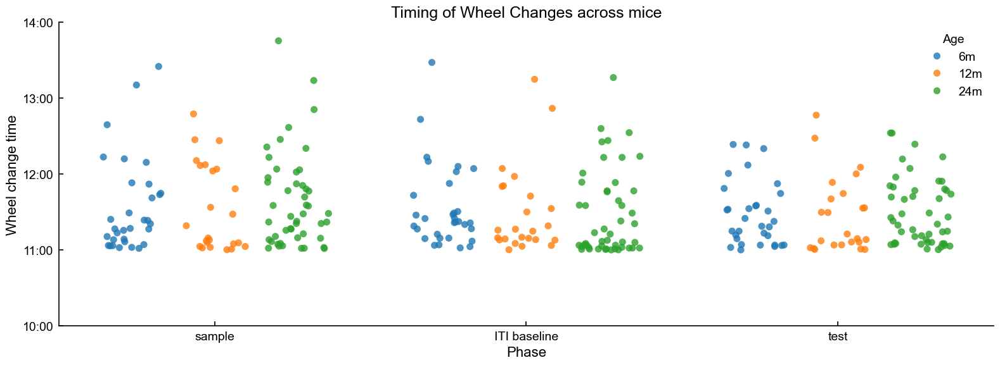

In [11]:
# Wheel change timing QC plot

wheel_times = events.copy()

wheel_times["rotation"] = pd.to_datetime(wheel_times["rotation"])
wheel_times["clock_time"] = (
    wheel_times["rotation"].dt.hour
    + wheel_times["rotation"].dt.minute / 60
    + wheel_times["rotation"].dt.second / 3600
)

wheel_times["Phase"] = wheel_times["Phase"].replace({
    "ITI_baseline": "ITI baseline",
    "post_trial_baseline": "Post-trial baseline"
})

fig, ax = plt.subplots(figsize=(WIDE_W, FIG_H))

sns.stripplot(
    data=wheel_times,
    x="Phase",
    y="clock_time",
    hue="Age",
    order=[
        "sample",
        "ITI baseline",
        "test"
    ],
    hue_order=AGE_ORDER,
    dodge=True,
    jitter=0.3,
    size=8,
    alpha=0.8,
    ax=ax
)

format_axes(ax)

ax.set_ylabel("Wheel change time")
ax.set_xlabel("Phase")
ax.set_title("Timing of Wheel Changes across mice")

ax.set_yticks([10, 11, 12, 13, 14])
ax.set_yticklabels(["10:00", "11:00", "12:00", "13:00", "14:00"])

ax.legend(
    title="Age",
    frameon=False
)

plt.tight_layout()
plt.show()

# Total exploration 

This plot compares total exploration for each phase.



In [12]:
phase_total = (
    main_binned
    .groupby(["MouseSessionID", "KageID", "Cohort", "Age", "Genotype", "Phase"], as_index=False)["total_sec"]
    .sum()
)

phase_total.head()

,MouseSessionID,KageID,Cohort,Age,Genotype,Phase,total_sec
0,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,ITI_baseline,803.0
1,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,sample,1452.0
2,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,test,774.5
3,2024-05-may-jul_NLGF6m_Kage11,Kage11,2024-05-may-jul_NLGF6m,6m,WT,ITI_baseline,1077.5
4,2024-05-may-jul_NLGF6m_Kage11,Kage11,2024-05-may-jul_NLGF6m,6m,WT,sample,1828.0


/var/folders/g8/st_0_lj16j97jxz803bqsb8c0000gn/T/ipykernel_21608/2042367436.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([clean_phase_label(x.get_text()) for x in ax.get_xticklabels()], rotation=20, ha="right")
/var/folders/g8/st_0_lj16j97jxz803bqsb8c0000gn/T/ipykernel_21608/2042367436.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([clean_phase_label(x.get_text()) for x in ax.get_xticklabels()], rotation=20, ha="right")
/var/folders/g8/st_0_lj16j97jxz803bqsb8c0000gn/T/ipykernel_21608/2042367436.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([clean_phase_label(x.get_text()) for x in ax.get_xticklabels()], rotation=20, ha="right")


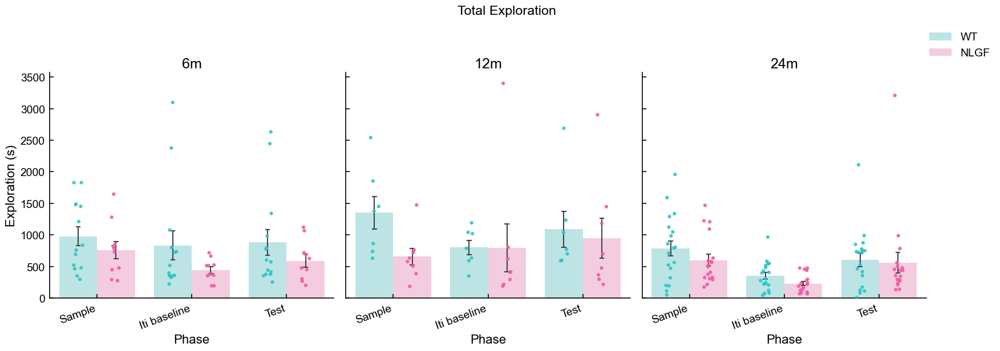

In [13]:
def plot_total_exploration_by_age(phase_total):
    fig, axes = plt.subplots(1, len(AGE_ORDER), figsize=(18, 6), sharey=True)

    for ax, age in zip(axes, AGE_ORDER):
        sub = phase_total[phase_total["Age"] == age].copy()

        sns.barplot(
            data=sub,
            x="Phase",
            y="total_sec",
            hue="Genotype",
            order=PHASE_ORDER,
            hue_order=GENO_ORDER,
            palette=GENO_COLORS,
            errorbar="se",
            capsize=0.08,
            err_kws={"linewidth": 1.5},
            alpha=0.35,
            ax=ax
        )

        sns.stripplot(
            data=sub,
            x="Phase",
            y="total_sec",
            hue="Genotype",
            order=PHASE_ORDER,
            hue_order=GENO_ORDER,
            palette=GENO_COLORS,
            dodge=True,
            size=4.5,
            alpha=0.9,
            ax=ax
        )

        format_axes(ax)
        ax.set_title(age)
        ax.set_xlabel("Phase")
        ax.set_ylabel("Exploration (s)" if age == AGE_ORDER[0] else "")
        ax.set_xticklabels([clean_phase_label(x.get_text()) for x in ax.get_xticklabels()], rotation=20, ha="right")

        # remove duplicate legends inside each subplot
        if ax.get_legend() is not None:
            ax.get_legend().remove()

    handles, labels = axes[-1].get_legend_handles_labels()
    fig.legend(
        handles[:len(GENO_ORDER)],
        labels[:len(GENO_ORDER)],
        frameon=False,
        loc="upper right",
        bbox_to_anchor=(0.98, 0.98)
    )

    fig.suptitle("Total Exploration", y=1.03)
    plt.tight_layout(rect=[0, 0, 0.92, 0.98])
    plt.show()

plot_total_exploration_by_age(phase_total)


# Average exploration over time

These are exploration-rate plots.

- 4-hour: `0-240 min`
- 24-hour: `0-1440 min`

The average is calculated separately within each age, genotype, phase and time bin.

In [14]:
def plot_phase_rows_for_one_age(
    summary_df,
    age,
    y_label,
    title,
    cutoff_min,
    sigma=0.5
):
    fig, axes = plt.subplots(
        len(PHASE_ORDER),
        1,
        figsize=(WIDE_W, WIDE_H),
        sharex=True,
        sharey=True
    )

    age_df = summary_df[
        summary_df["Age"] == age
    ].copy()

    for ax, phase in zip(axes, PHASE_ORDER):

        phase_df = age_df[
            age_df["Phase"] == phase
        ].copy()

        for genotype in GENO_ORDER:

            temp = phase_df[
                phase_df["Genotype"] == genotype
            ].sort_values("time_min")

            if temp.empty:
                continue

            y = gaussian_filter1d(
                temp["mean_value"].values,
                sigma=sigma
            )

            sem = gaussian_filter1d(
                temp["sem_value"].fillna(0).values,
                sigma=sigma
            )

            ax.plot(
                temp["time_min"],
                y,
                color=GENO_COLORS[genotype],
                label=genotype,
                linewidth=2
            )

            ax.fill_between(
                temp["time_min"],
                y - sem,
                y + sem,
                color=GENO_COLORS[genotype],
                alpha=0.2
            )

        format_axes(ax)

        ax.set_title(phase.replace("_", " ").capitalize())
        ax.set_ylabel(y_label)

    axes[-1].set_xlabel("Time from wheel change (min)")
    axes[-1].set_xlim(0, cutoff_min)

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        frameon=False,
        loc="upper right",
        bbox_to_anchor=(0.98, 0.98)
    )

    fig.suptitle(f"{title} ({age})", y=1.02)

    plt.tight_layout()
    plt.show()

In [15]:
avg_4h_binned = rebin_timeseries(
    main_binned,
    value_cols=["total_sec"],
    bin_factor=1,
    cutoff_min=240
)

avg_4h_summary = summarise_timeseries(
    avg_4h_binned,
    "total_sec"
)

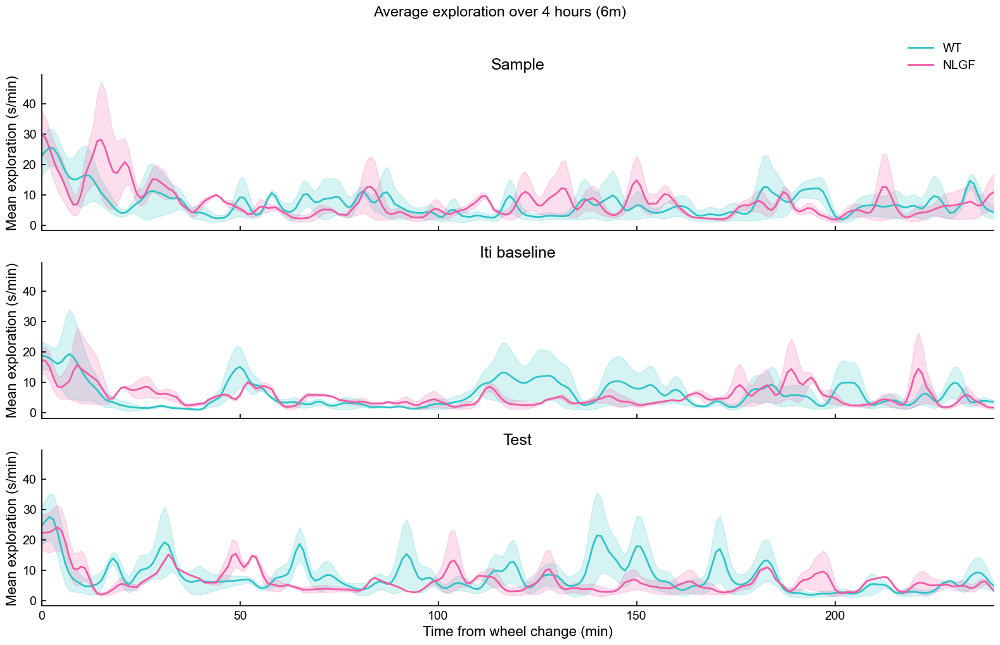

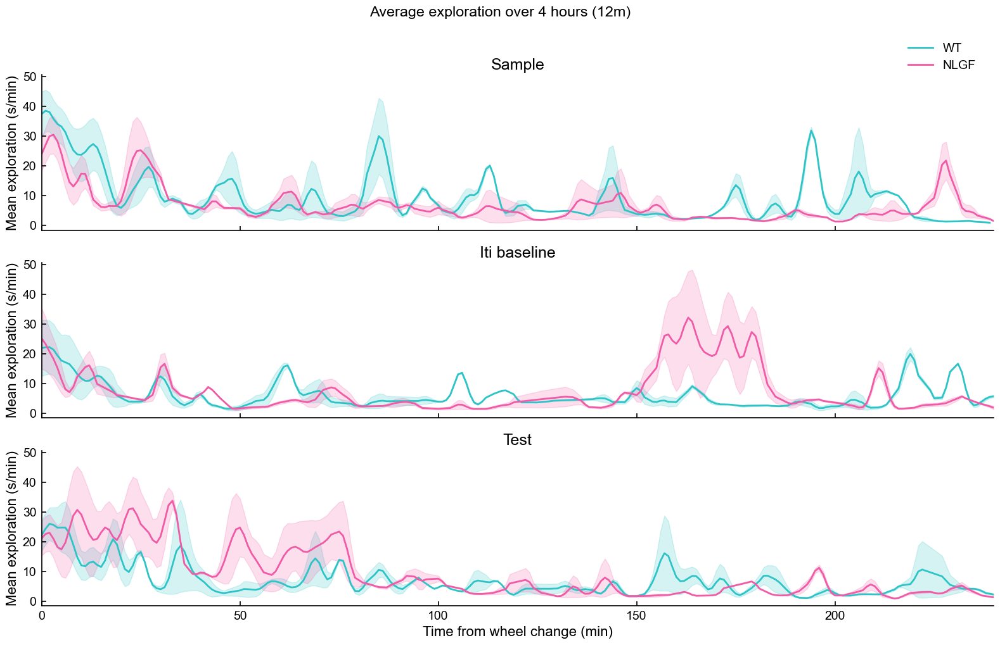

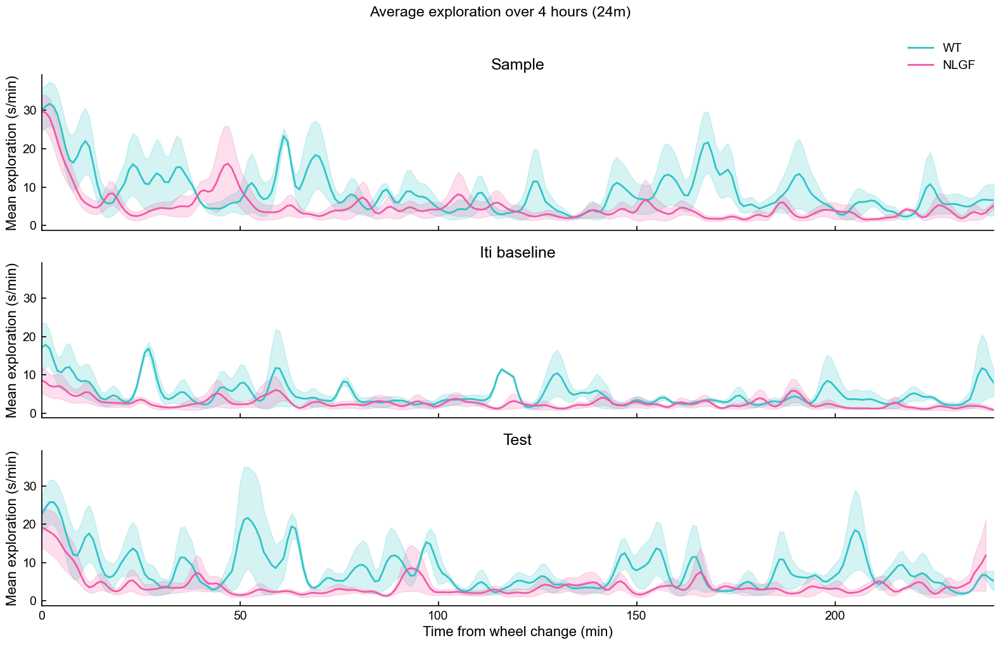

In [16]:
for age in AGE_ORDER:
    plot_phase_rows_for_one_age(
        avg_4h_summary,
        age=age,
        y_label="Mean exploration (s/min)",
        title="Average exploration over 4 hours",
        cutoff_min=240,
        sigma=SMOOTH_SIGMA
    )

In [17]:
avg_8h_binned = rebin_timeseries(
    main_binned,
    value_cols=["total_sec"],
    bin_factor=1,
    cutoff_min=480
)

avg_8h_summary = summarise_timeseries(
    avg_8h_binned,
    "total_sec"
)

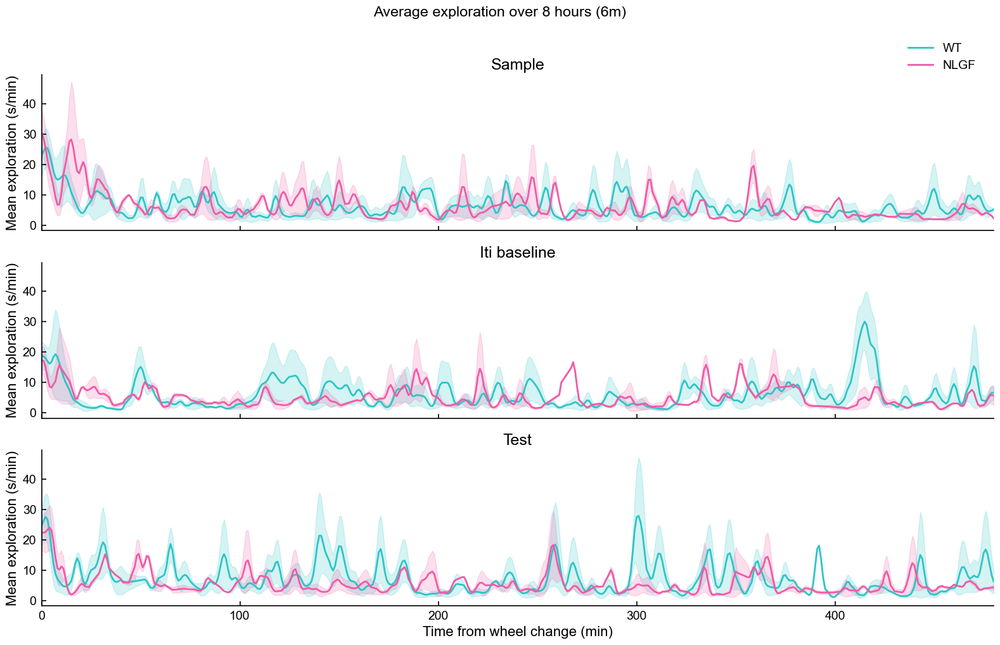

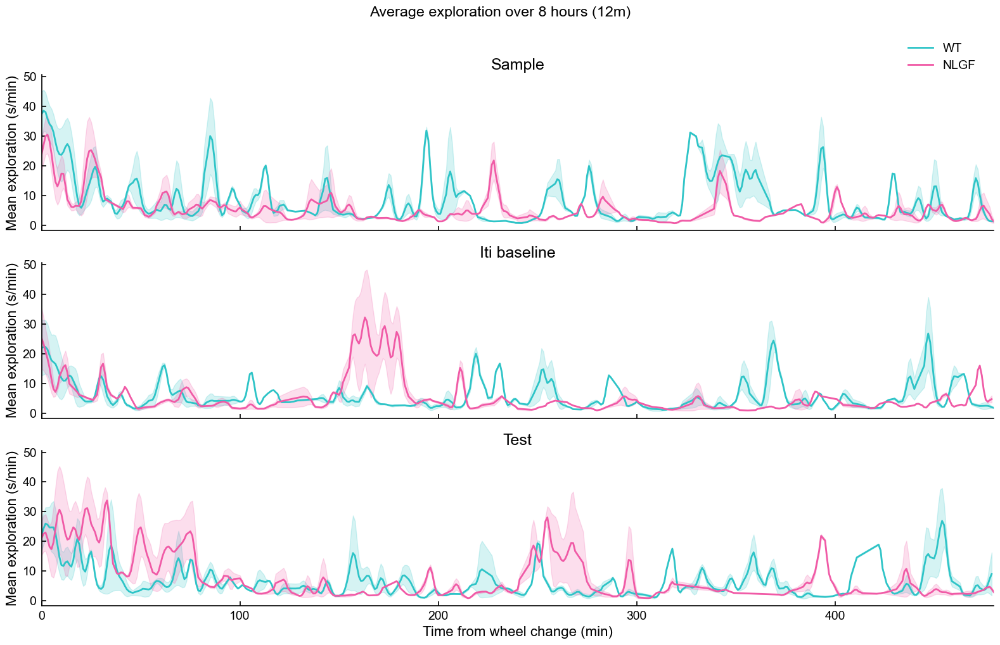

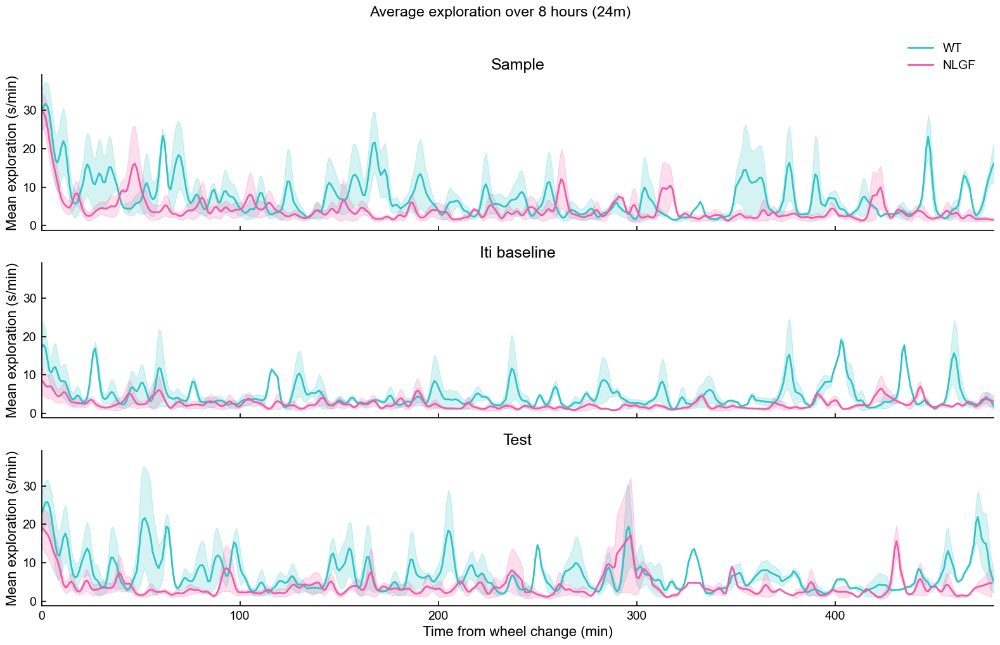

In [18]:
for age in AGE_ORDER:
    plot_phase_rows_for_one_age(
        avg_8h_summary,
        age=age,
        y_label="Mean exploration (s/min)",
        title="Average exploration over 8 hours",
        cutoff_min=480,
        sigma=SMOOTH_SIGMA
    )

In [19]:
avg_24h_binned = rebin_timeseries(
    main_binned,
    value_cols=["total_sec"],
    bin_factor=1,
    cutoff_min=1440
)

avg_24h_summary = summarise_timeseries(
    avg_24h_binned,
    "total_sec"
)

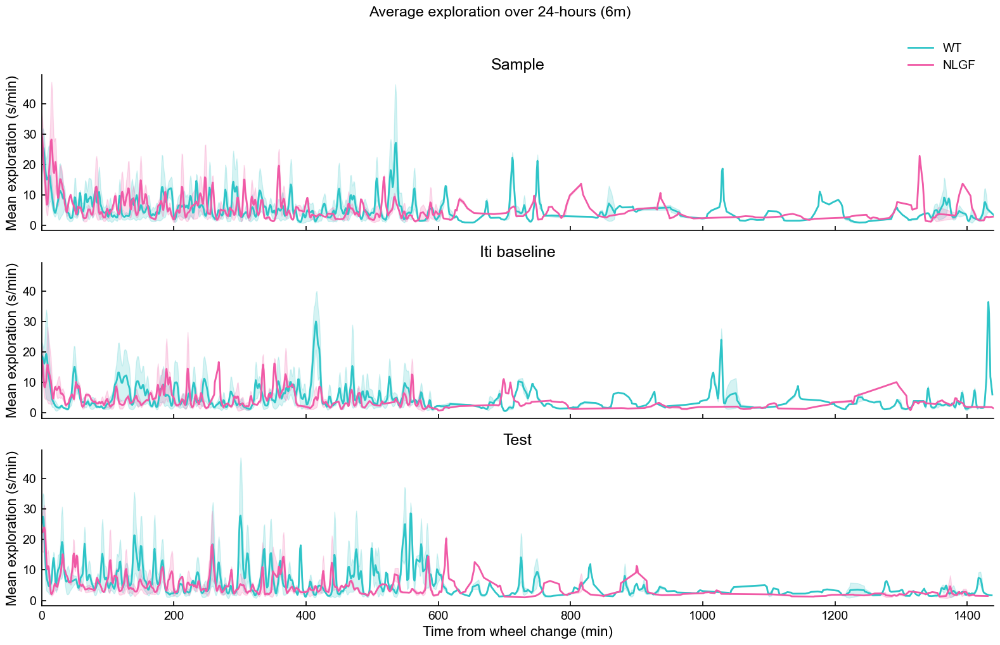

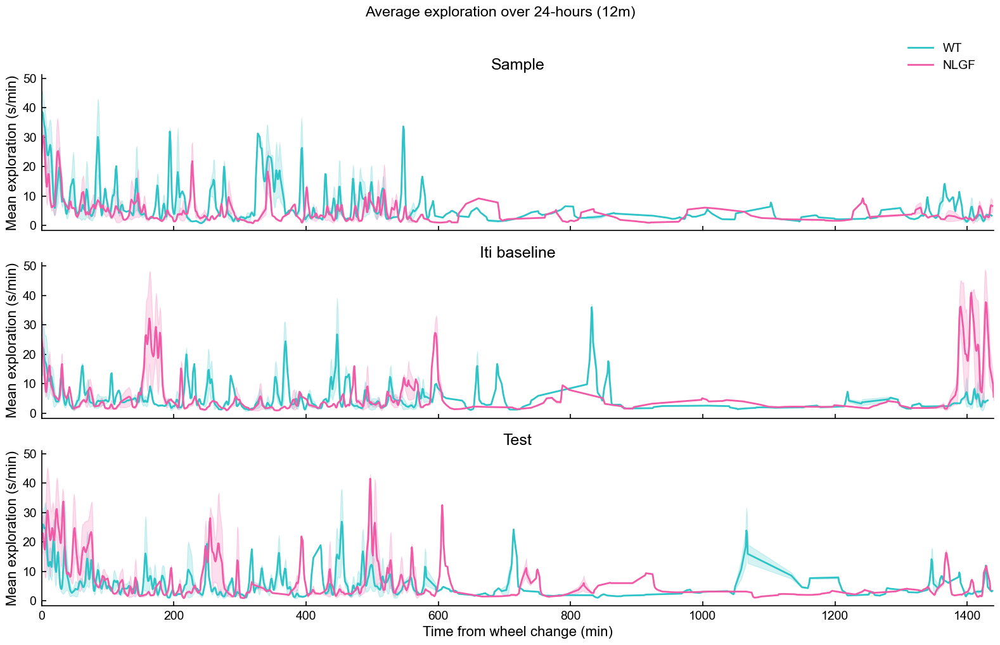

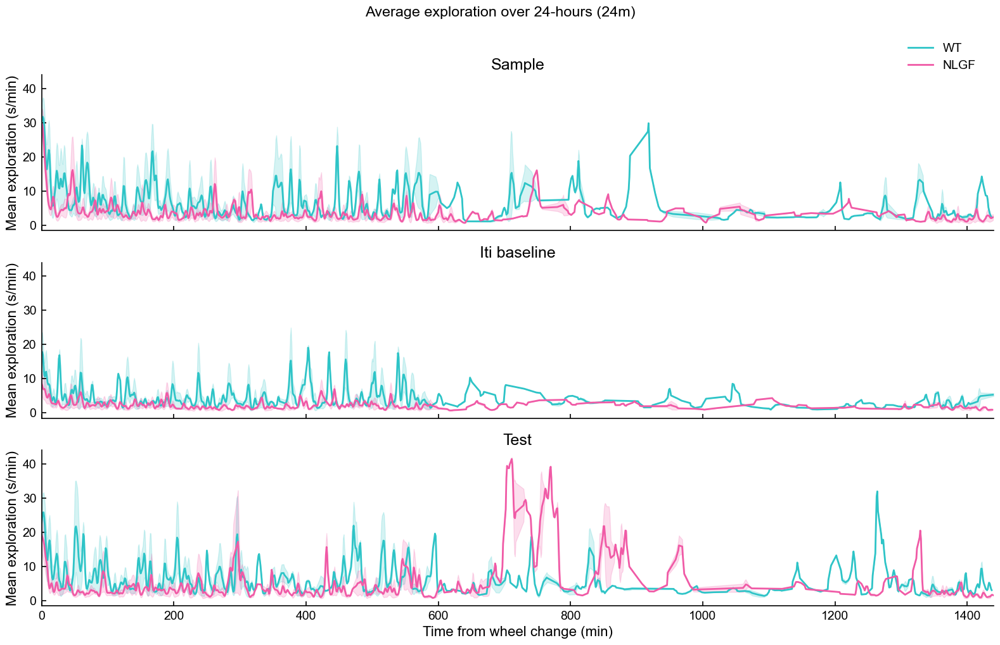

In [20]:
for age in AGE_ORDER:
    plot_phase_rows_for_one_age(
        avg_24h_summary,
        age=age,
        y_label="Mean exploration (s/min)",
        title="Average exploration over 24-hours",
        cutoff_min=1440,
        sigma=SMOOTH_SIGMA
    )

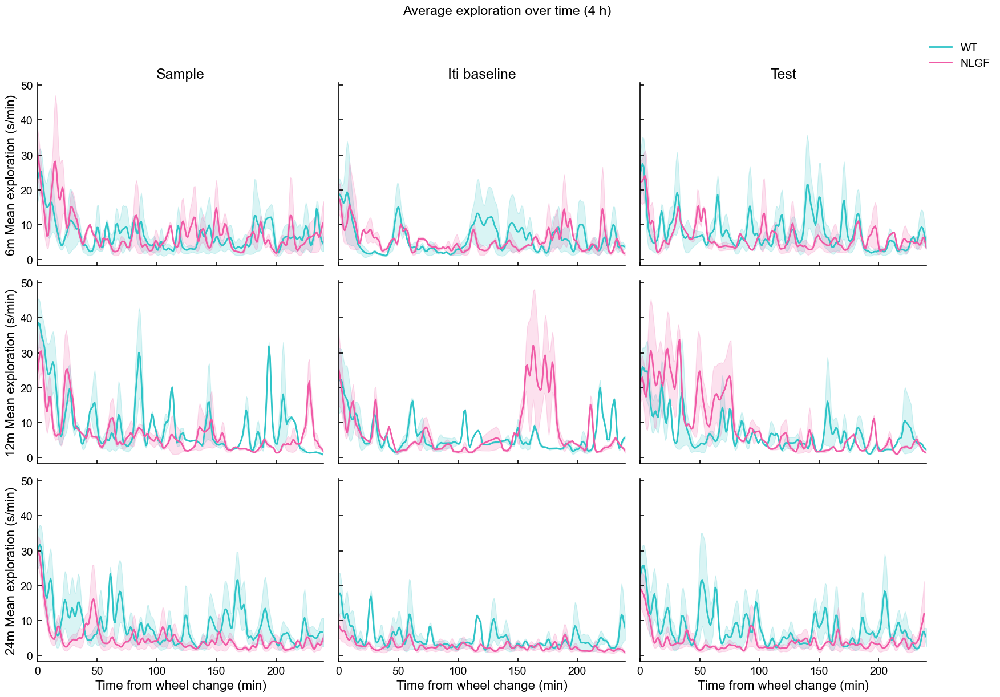

In [21]:
# Average exploration: 4 h
avg_4h_binned = rebin_timeseries(
    main_binned,
    value_cols=["total_sec"],
    bin_factor=1,
    cutoff_min=240
)

avg_4h_summary = summarise_timeseries(avg_4h_binned, "total_sec")

plot_age_phase_grid(
    avg_4h_summary,
    y_label=" Mean exploration (s/min)",
    title="Average exploration over time (4 h)",
    cutoff_min=240,
    sigma=SMOOTH_SIGMA
)


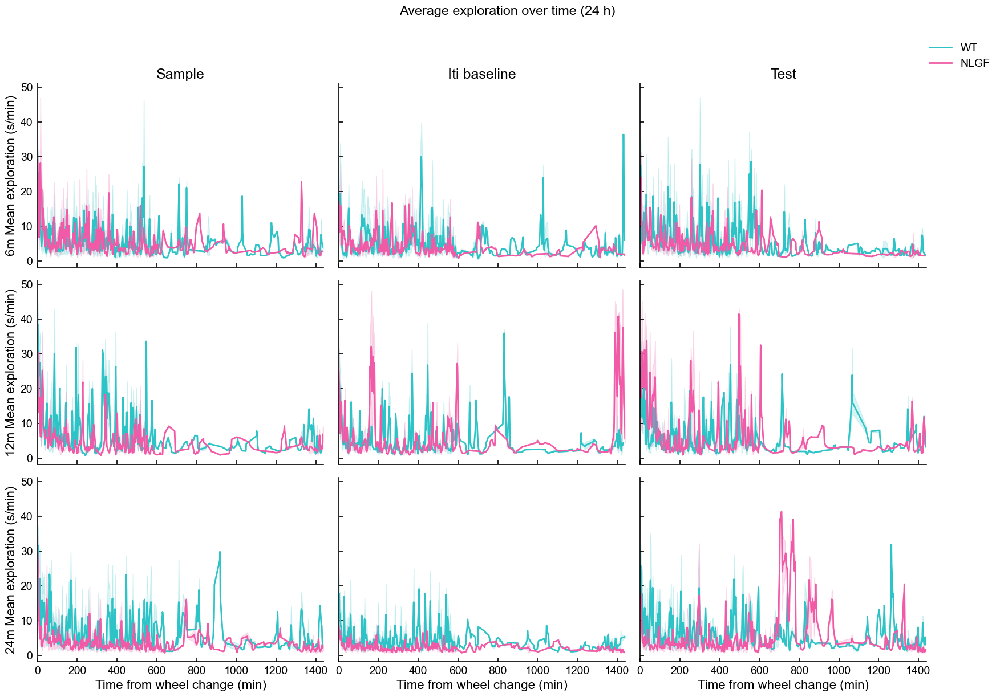

In [22]:
# Average exploration: 24 h
avg_24h_binned = rebin_timeseries(
    main_binned,
    value_cols=["total_sec"],
    bin_factor=1,
    cutoff_min=1440
)

avg_24h_summary = summarise_timeseries(avg_24h_binned, "total_sec")

plot_age_phase_grid(
    avg_24h_summary,
    y_label=" Mean exploration (s/min)",
    title="Average exploration over time (24 h)",
    cutoff_min=1440,
    sigma=SMOOTH_SIGMA
)


# Cumulative exploration

Cumulative exploration is recomputed from `total_sec`. This avoids drops in the curve when different mice have different phase lengths.

- 2 h cumulative exploration
- 24 h cumulative exploration


In [23]:
def make_cumulative_filled_master(data, cutoff_min=1440):
    full_bins = range(0, cutoff_min + 1)

    filled = []

    for (mouse, phase), df in data.groupby(["MouseSessionID", "Phase"]):

        df = df[df["time_min"] <= cutoff_min].copy()

        df["time_min"] = pd.to_numeric(df["time_min"], errors="coerce")
        df["cumulative_total_sec"] = pd.to_numeric(
            df["cumulative_total_sec"],
            errors="coerce"
        )

        df = df.dropna(subset=["time_min", "cumulative_total_sec"])

        meta = df.iloc[0][
            ["MouseSessionID", "KageID", "Cohort", "Age", "Genotype", "Phase"]
        ]

        df = (
            df
            .groupby("time_min", as_index=False)
            .agg(
                cumulative_total_sec=("cumulative_total_sec", "max")
            )
        )

        df = df.set_index("time_min").reindex(full_bins)

        for col in meta.index:
            df[col] = meta[col]

        df["cumulative_total_sec"] = (
            df["cumulative_total_sec"]
            .ffill()
            .fillna(0)
        )

        filled.append(df.reset_index())

    return pd.concat(filled, ignore_index=True)

In [24]:
# Make the full 24 h filled cumulative table once
binned_filled_24h = make_cumulative_filled_master(
    main_binned,
    cutoff_min=1440
)

binned_filled_2h = binned_filled_24h[
    binned_filled_24h["time_min"] <= 120
].copy()

cum_2h_summary = (
    binned_filled_2h
    .groupby(["Age", "Genotype", "Phase", "time_min"], as_index=False)
    .agg(
        mean_value=("cumulative_total_sec", "mean"),
        sem_value=("cumulative_total_sec", lambda x: x.sem())
    )
)

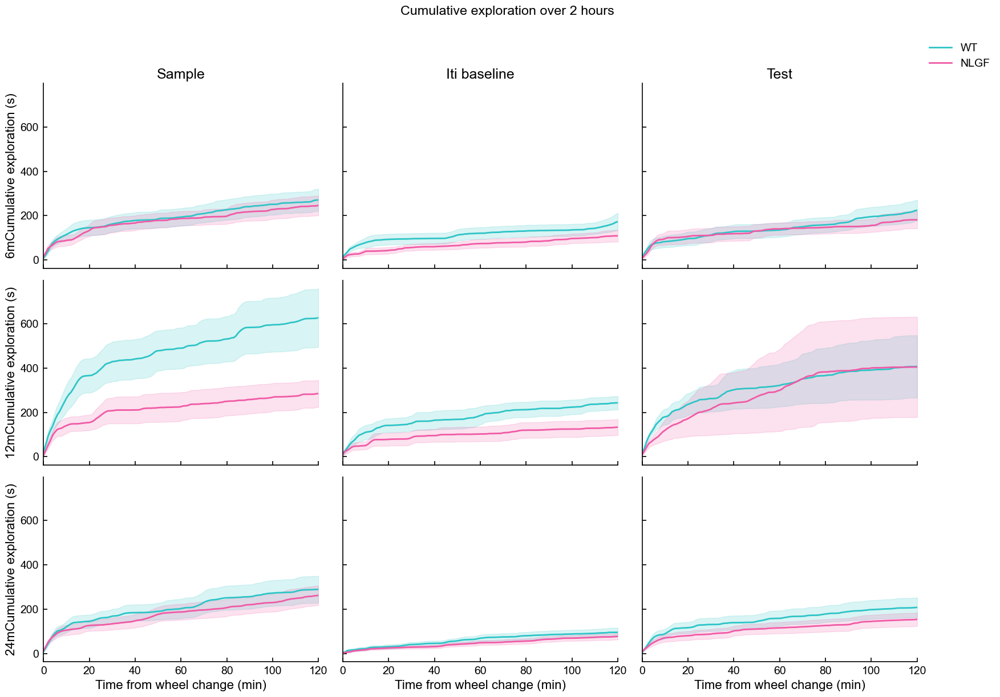

In [25]:
plot_age_phase_grid(
    cum_2h_summary,
    y_label="Cumulative exploration (s)",
    title="Cumulative exploration over 2 hours",
    cutoff_min=120,
    sigma=0.5
)

In [26]:
binned_filled_10h = binned_filled_24h[
    binned_filled_24h["time_min"] <= 600
].copy()

cum_10h_summary = (
    binned_filled_10h
    .groupby(["Age", "Genotype", "Phase", "time_min"], as_index=False)
    .agg(
        mean_value=("cumulative_total_sec", "mean"),
        sem_value=("cumulative_total_sec", lambda x: x.sem())
    )
)

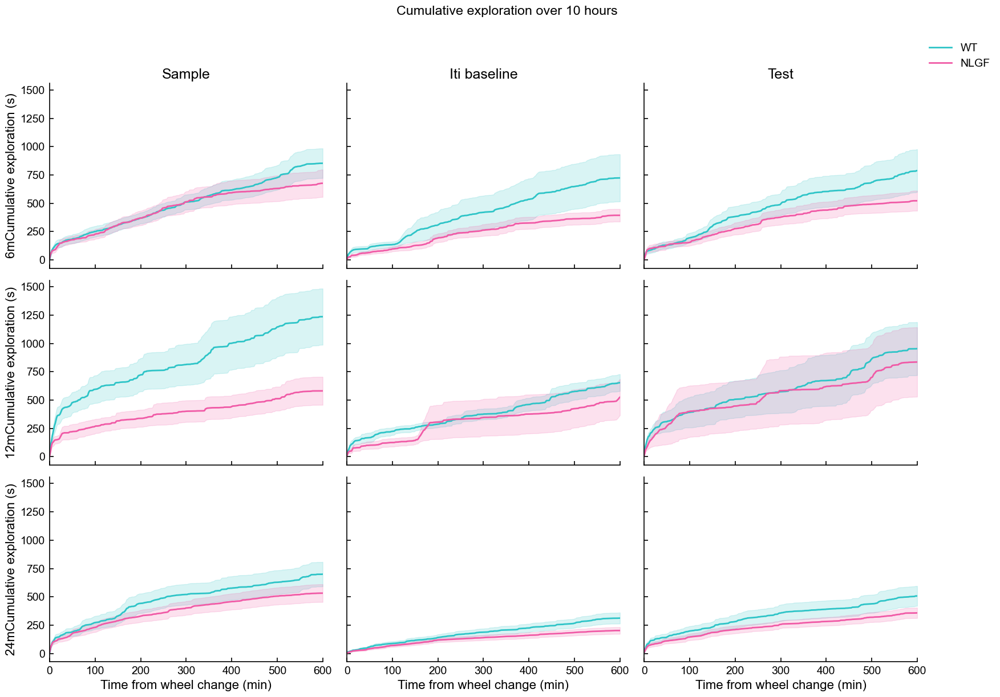

In [27]:
plot_age_phase_grid(
    cum_10h_summary,
    y_label="Cumulative exploration (s)",
    title="Cumulative exploration over 10 hours",
    cutoff_min=600,
    sigma=0.5
)

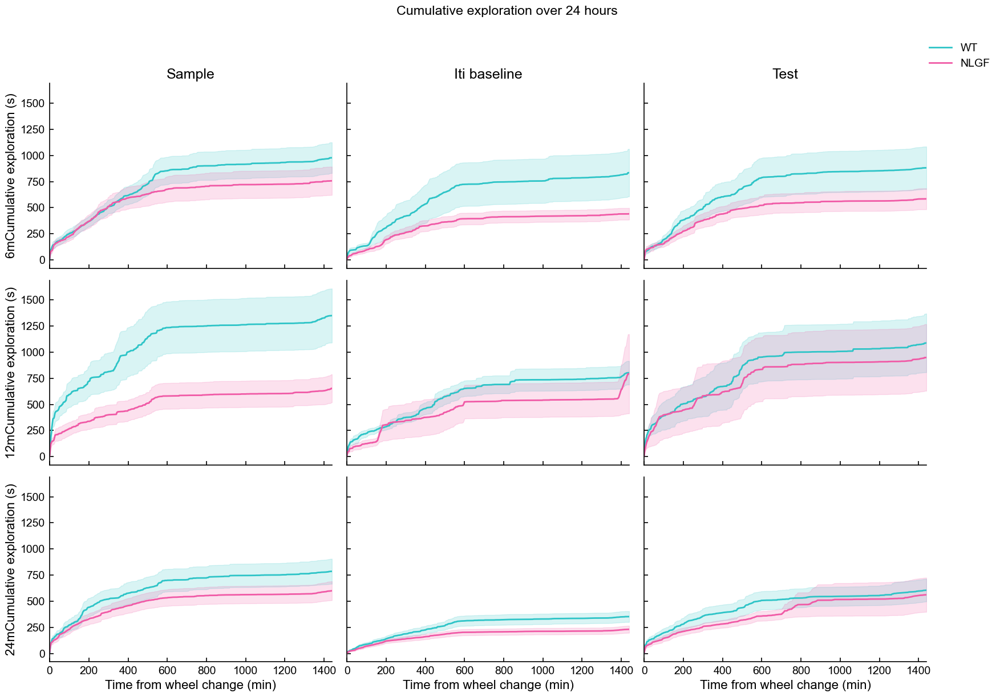

In [28]:
cum_24h_summary = (
    binned_filled_24h
    .groupby(["Age", "Genotype", "Phase", "time_min"], as_index=False)
    .agg(
        mean_value=("cumulative_total_sec", "mean"),
        sem_value=("cumulative_total_sec", lambda x: x.sem())
    )
)

plot_age_phase_grid(
    cum_24h_summary,
    y_label="Cumulative exploration (s)",
    title="Cumulative exploration over 24 hours",
    cutoff_min=1440,
    sigma=0.5
)

# Novel/Familiar & Left/Right Discrimination Index

For test phase only:

- `NOR_side = L` means left side is novel.
- `NOR_side = R` means right side is novel.

DI is calculated at the mouse/session level first, then averaged by age and genotype.

Two DI measures are generated:

1. Novel/familiar DI

`(Novel - Familiar) / (Novel + Familiar)`

2. Side-bias DI

`(Left - Right) / (Left + Right)`


In [29]:
def make_test_di_table(data, cutoff_min=120, bin_factor=1):
    test = data[data["Phase"] == "test"].copy()

    needed = ["left_sec", "right_sec", "NOR_side"]
    missing = [c for c in needed if c not in test.columns]
    if missing:
        raise ValueError(f"Missing required columns for DI: {missing}")

    test = rebin_timeseries(
        test,
        value_cols=["left_sec", "right_sec"],
        bin_factor=bin_factor,
        cutoff_min=cutoff_min
    )

    # rebin_timeseries drops NOR_side, so bring it back per MouseSessionID
    meta_cols = ["MouseSessionID", "NOR_side"]
    meta = data[data["Phase"] == "test"][meta_cols].drop_duplicates("MouseSessionID")
    test = test.merge(meta, on="MouseSessionID", how="left")

    side = test["NOR_side"].astype(str).str.upper().str[0]

    test["novel_sec"] = np.where(side == "L", test["left_sec"], test["right_sec"])
    test["familiar_sec"] = np.where(side == "L", test["right_sec"], test["left_sec"])

    test["novel_familiar_total"] = test["novel_sec"] + test["familiar_sec"]
    test["left_right_total"] = test["left_sec"] + test["right_sec"]

    test["DI"] = np.where(
        test["novel_familiar_total"] > 0,
        (test["novel_sec"] - test["familiar_sec"]) / test["novel_familiar_total"],
        np.nan
    )

    test["side_bias_DI"] = np.where(
        test["left_right_total"] > 0,
        (test["left_sec"] - test["right_sec"]) / test["left_right_total"],
        np.nan
    )

    return test


def summarise_di(di_table, value_col):
    return (
        di_table
        .groupby(["Age", "Genotype", "time_min"], as_index=False)
        .agg(
            mean_value=(value_col, "mean"),
            sem_value=(value_col, sem),
            n=(value_col, "count")
        )
    )


def plot_di_by_age(di_summary, title, cutoff_min, y_label="DI", sigma=2):
    fig, axes = plt.subplots(len(AGE_ORDER), 1, figsize=(14, 10), sharex=True, sharey=True)

    for ax, age in zip(axes, AGE_ORDER):
        sub = di_summary[di_summary["Age"] == age].copy()

        for genotype in GENO_ORDER:
            temp = sub[sub["Genotype"] == genotype].sort_values("time_min")
            if temp.empty:
                continue

            y = gaussian_filter1d(temp["mean_value"].values, sigma=2)
            e = gaussian_filter1d(temp["sem_value"].fillna(0).values, sigma=2)

            ax.plot(
                temp["time_min"],
                y,
                color=GENO_COLORS.get(genotype, "black"),
                label=genotype,
                linewidth=2
            )

            ax.fill_between(
                temp["time_min"],
                y - e,
                y + e,
                color=GENO_COLORS.get(genotype, "black"),
                alpha=0.18
            )

        ax.axhline(0, color="black", linestyle="--", linewidth=1)
        format_axes(ax)
        ax.set_xlim(0, cutoff_min)
        ax.set_ylim(-1, 1)
        ax.set_ylabel(f"{age}{y_label}")

    axes[-1].set_xlabel("Time from test wheel change (min)")

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, frameon=False, loc="upper right", bbox_to_anchor=(0.98, 0.98))
    fig.suptitle(title, y=1.02)
    plt.tight_layout(rect=[0, 0, 0.90, 0.98])
    plt.show()


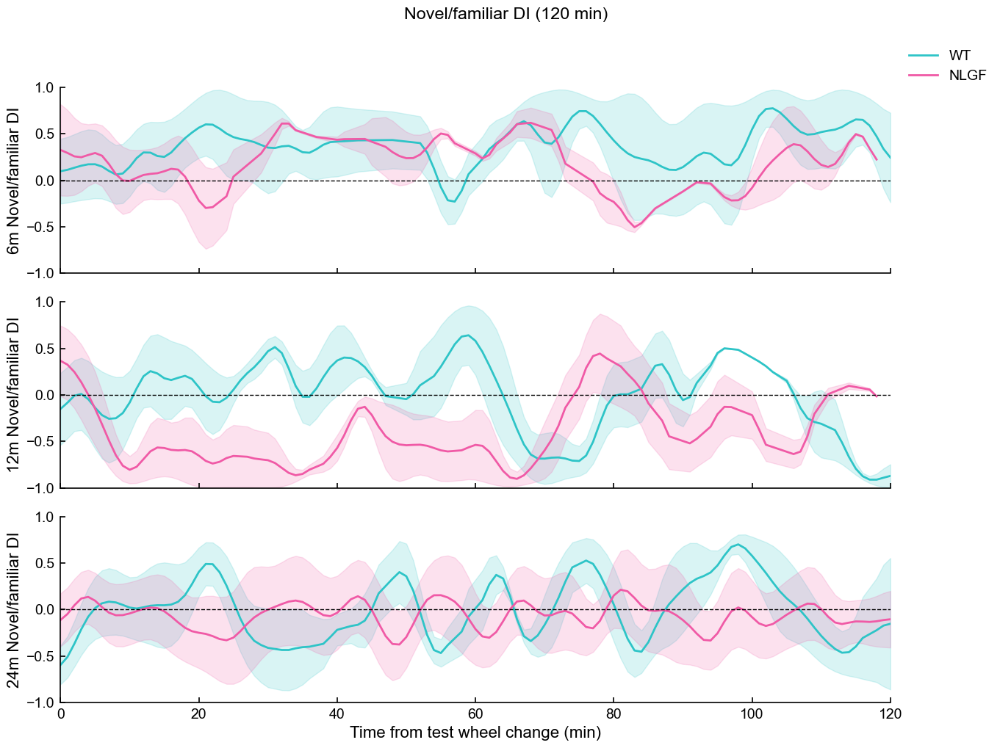

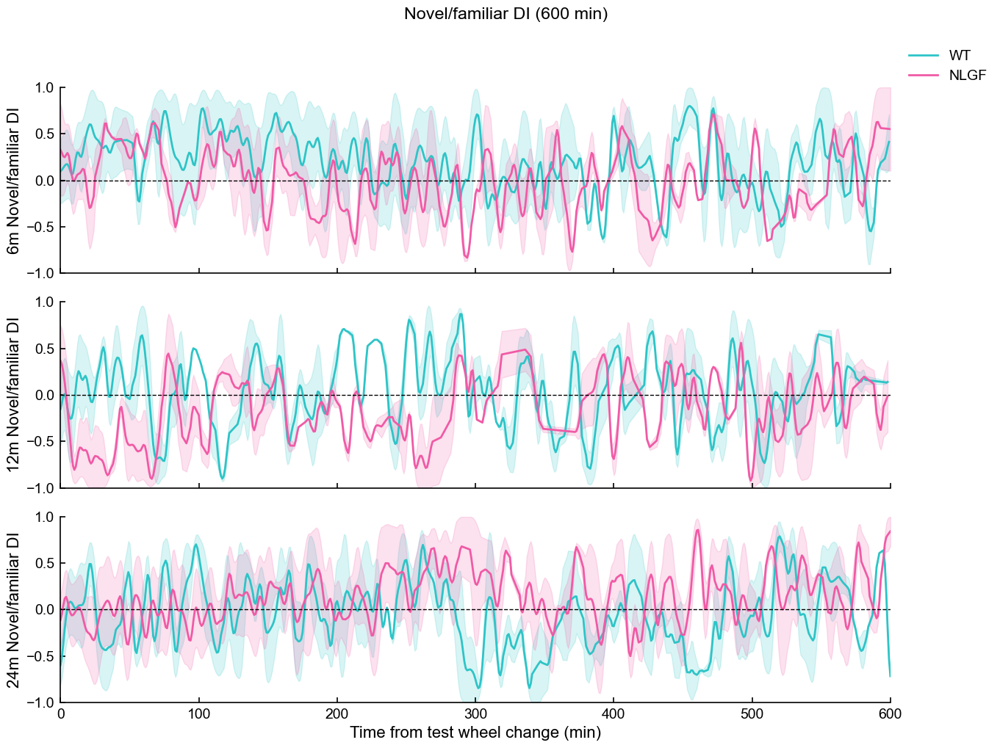

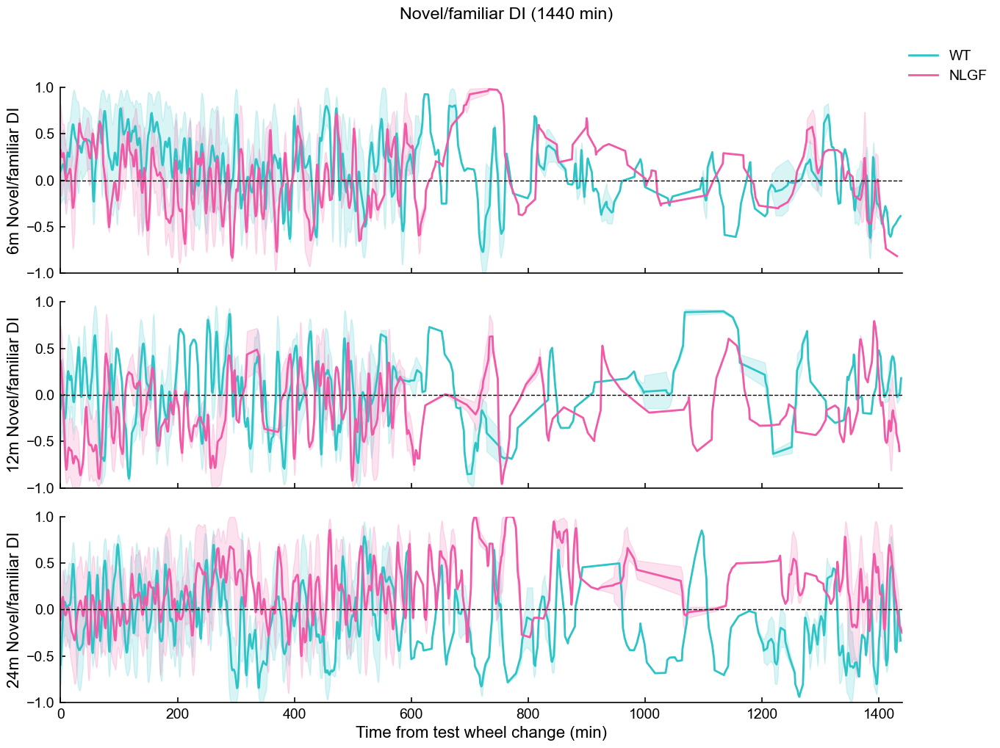

In [30]:
# Novel/familiar DI: 2 h, 10 h, 24 h
for cutoff in [120, 600, 1440]:
    di_table = make_test_di_table(main_binned, cutoff_min=cutoff, bin_factor=1)
    di_summary = summarise_di(di_table, "DI")
    plot_di_by_age(
        di_summary,
        title=f"Novel/familiar DI ({cutoff} min)",
        cutoff_min=cutoff,
        y_label=" Novel/familiar DI",
        sigma=2
    )


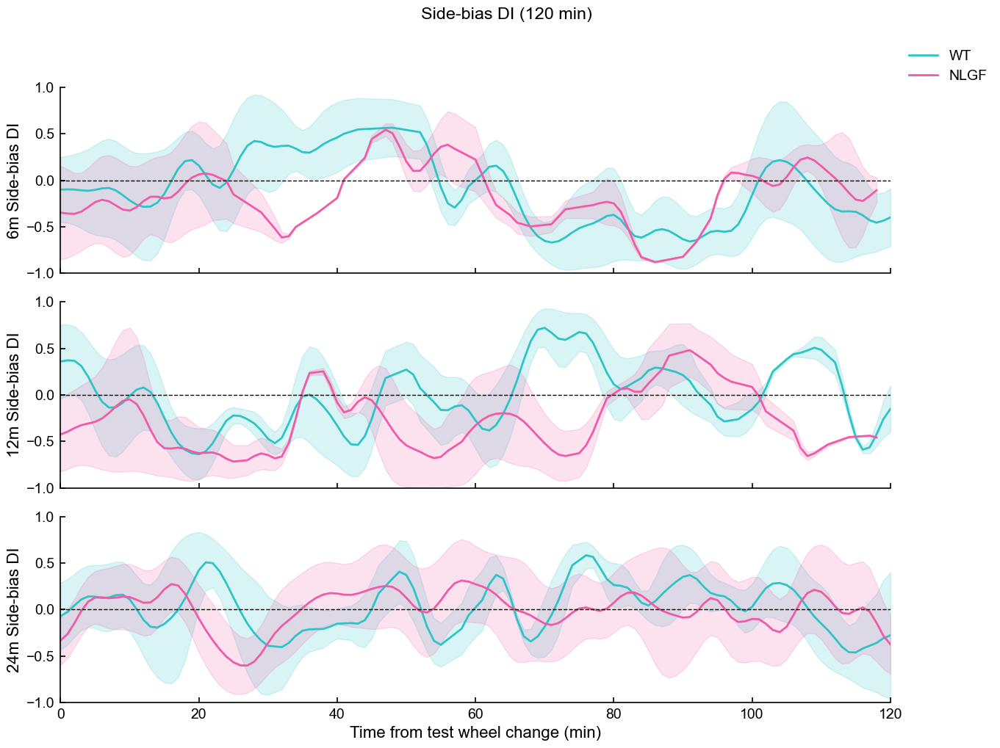

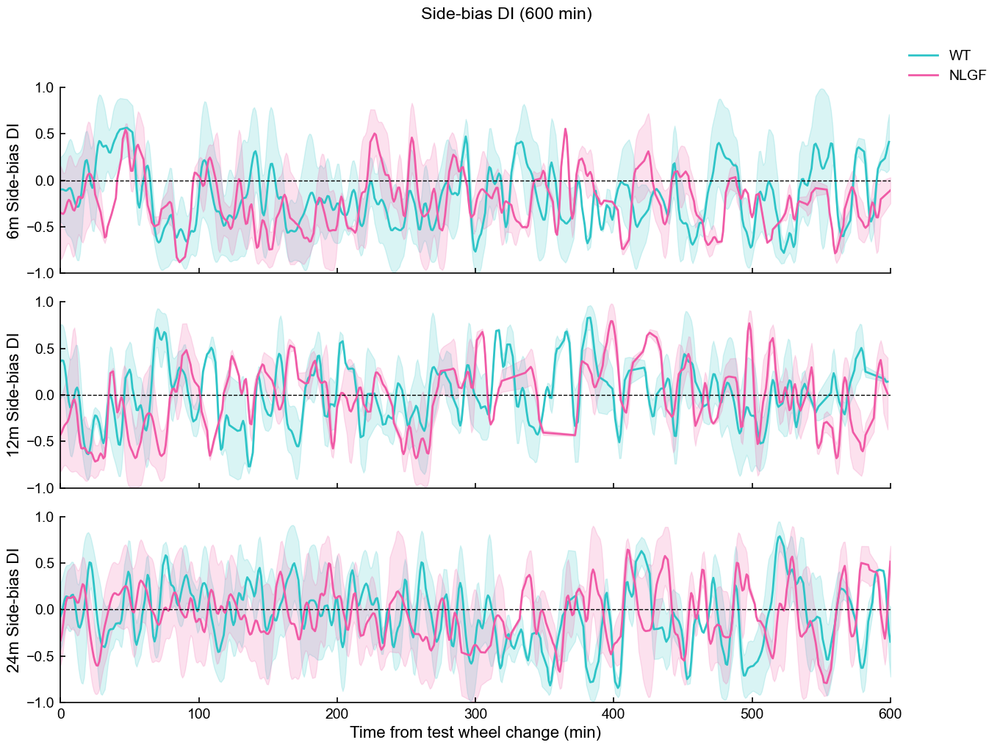

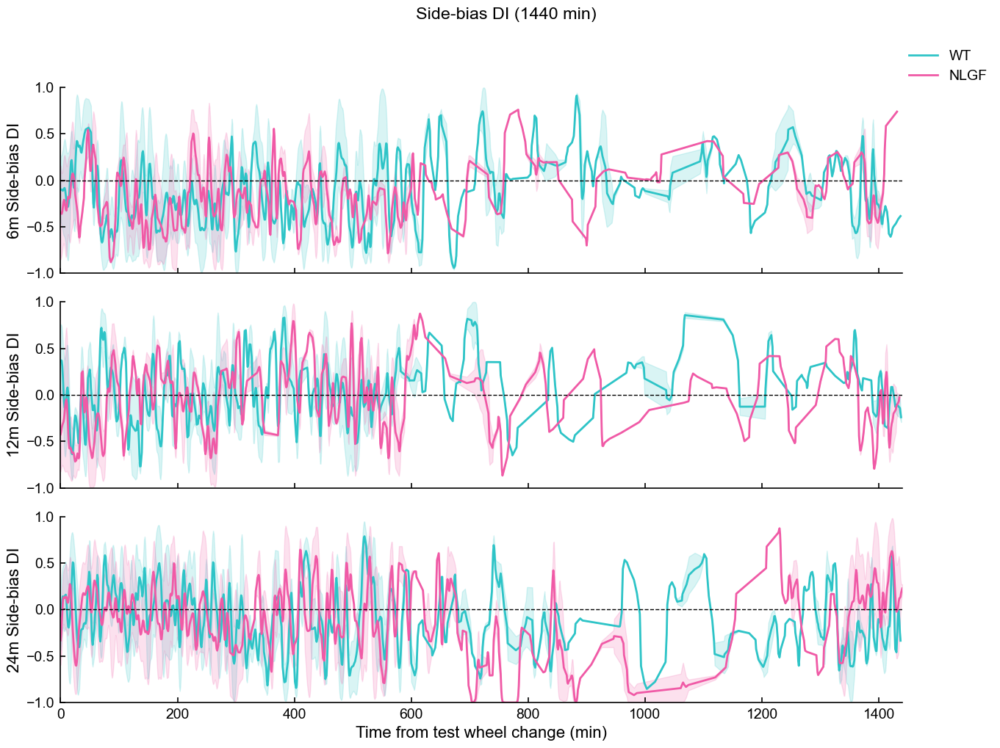

In [31]:
# Side-bias DI: 2 h, 10 h, 24 h
for cutoff in [120, 600, 1440]:
    side_table = make_test_di_table(main_binned, cutoff_min=cutoff, bin_factor=1)
    side_summary = summarise_di(side_table, "side_bias_DI")
    plot_di_by_age(
        side_summary,
        title=f"Side-bias DI ({cutoff} min)",
        cutoff_min=cutoff,
        y_label=" Side-bias DI",
        sigma=2
    )


In [32]:
DI_TIMEPOINTS = [120, 240, 360, 480]  # 2, 4, 6, 8 h

di_timepoint_df = []

for t in DI_TIMEPOINTS:

    temp = di_table[
        di_table["time_min"] <= t
    ].copy()

    summary = (
        temp
        .groupby(["Age", "Genotype", "MouseSessionID"], as_index=False)
        .agg(
            novel_sec=("novel_sec", "sum"),
            familiar_sec=("familiar_sec", "sum")
        )
    )

    summary["DI"] = (
        (summary["novel_sec"] - summary["familiar_sec"]) /
        (summary["novel_sec"] + summary["familiar_sec"])
    )

    summary["timepoint_h"] = t / 60

    di_timepoint_df.append(summary)

di_timepoint_df = pd.concat(di_timepoint_df, ignore_index=True)

di_timepoint_df.head()

,Age,Genotype,MouseSessionID,novel_sec,familiar_sec,DI,timepoint_h
0,12m,APP1-em1BDS,2024-07-jul-sep_NLGF12m_Kage10,116.0,37.0,0.516340,2.0
1,12m,APP1-em1BDS,2024-07-jul-sep_NLGF12m_Kage12,74.0,44.5,0.248945,2.0
2,12m,APP1-em1BDS,2024-07-jul-sep_NLGF12m_Kage21,130.0,154.5,-0.086116,2.0
3,12m,APP1-em1BDS,2024-07-jul-sep_NLGF12m_Kage23,2194.5,67.0,0.940747,2.0
4,12m,APP1-em1BDS,2024-07-jul-sep_NLGF12m_Kage24,116.5,142.0,-0.098646,2.0


In [33]:
def plot_di_timepoints_by_age(di_df, age):

    fig, ax = plt.subplots(figsize=(FIG_W, FIG_H))

    plot_df = di_df[
        di_df["Age"] == age
    ].copy()

    sns.barplot(
        data=plot_df,
        x="timepoint_h",
        y="DI",
        hue="Genotype",
        hue_order=GENO_ORDER,
        palette=GENO_COLORS,
        errorbar="se",
        capsize=0.1,
        alpha=0.35,
        err_kws={"linewidth":1.5},
        ax=ax
    )

    sns.stripplot(
        data=plot_df,
        x="timepoint_h",
        y="DI",
        hue="Genotype",
        hue_order=GENO_ORDER,
        palette=GENO_COLORS,
        dodge=True,
        size=4,
        alpha=0.9,
        ax=ax
    )

    format_axes(ax)

    ax.axhline(
        0,
        color="black",
        linestyle="--",
        linewidth=1
    )

    ax.set_xlabel("Time after wheel change (h)")
    ax.set_ylabel("Discrimination index")
    ax.set_title(f"{age} discrimination index")

    handles, labels = ax.get_legend_handles_labels()

    ax.legend(
        handles[:len(GENO_ORDER)],
        labels[:len(GENO_ORDER)],
        frameon=False
    )

    plt.tight_layout()
    plt.show()

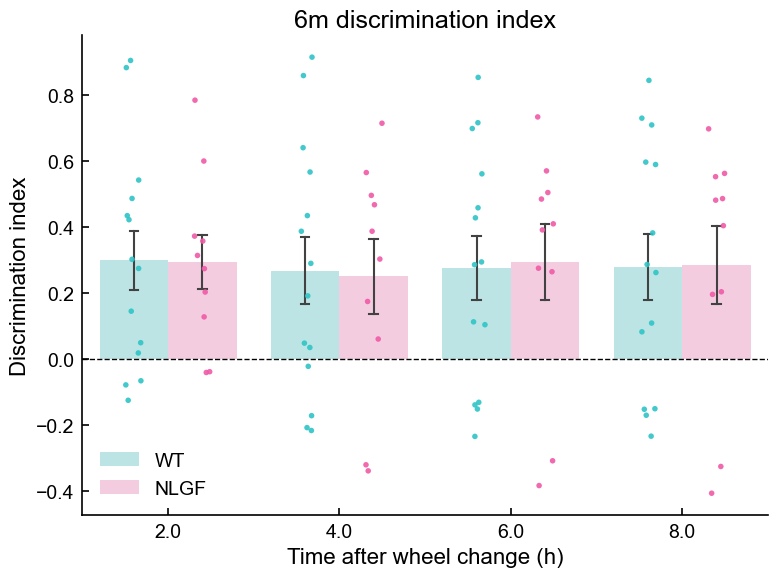

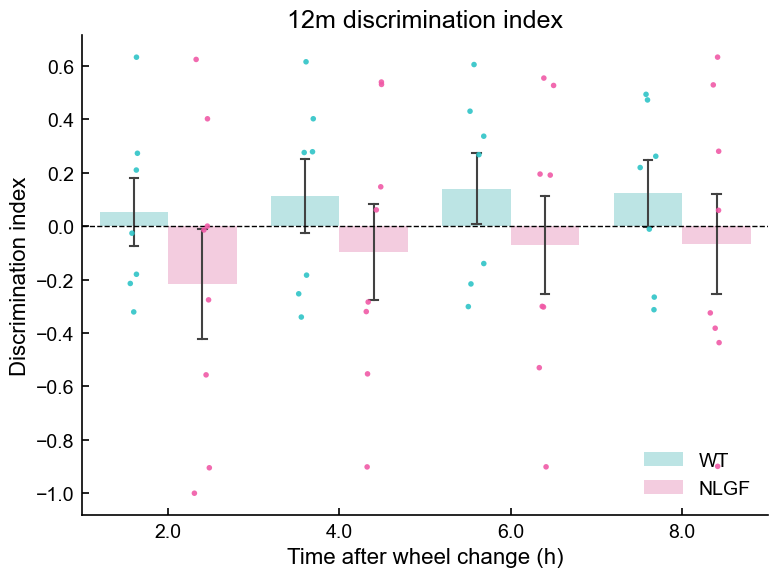

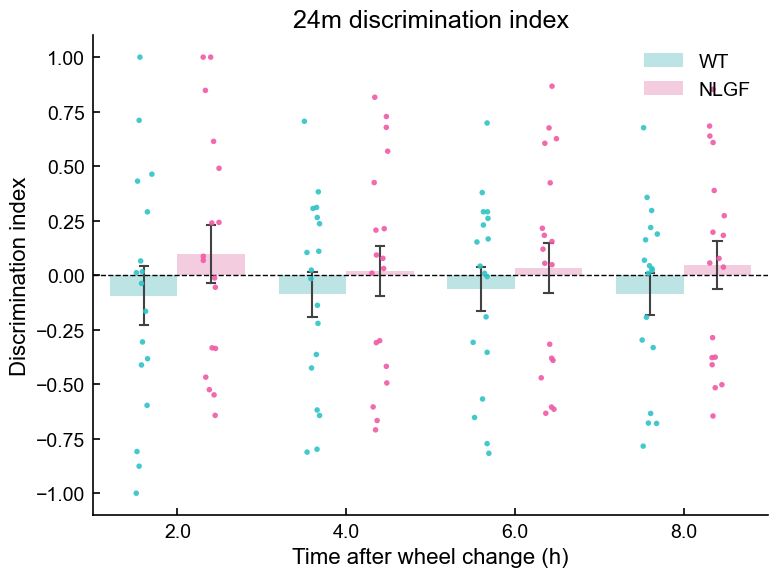

In [34]:
for age in AGE_ORDER:
    plot_di_timepoints_by_age(
        di_timepoint_df,
        age
    )

# Mouse-level DI summaries

These tables are useful for statistics.

They compute one DI per mouse/session over a fixed time window.


In [35]:
def mouse_level_test_di(data, cutoff_min=120):
    di_table = make_test_di_table(data, cutoff_min=cutoff_min, bin_factor=cutoff_min)

    out = di_table[[
        "MouseSessionID", "KageID", "Cohort", "Age", "Genotype",
        "novel_sec", "familiar_sec", "left_sec", "right_sec",
        "DI", "side_bias_DI"
    ]].copy()

    return out

mouse_di_2h = mouse_level_test_di(main_binned, cutoff_min=120)
mouse_di_10h = mouse_level_test_di(main_binned, cutoff_min=600)
mouse_di_24h = mouse_level_test_di(main_binned, cutoff_min=1440)

mouse_di_2h.head()


,MouseSessionID,KageID,Cohort,Age,Genotype,novel_sec,familiar_sec,left_sec,right_sec,DI,side_bias_DI
0,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,28.0,5.5,28.0,5.5,0.671642,0.671642
1,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,44.5,0.0,44.5,0.0,1.000000,1.000000
2,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,0.0,2.0,0.0,2.0,-1.000000,-1.000000
3,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,0.0,11.0,0.0,11.0,-1.000000,-1.000000
4,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,3.0,3.0,3.0,3.0,0.000000,0.000000


# First approach

1. Count of mice choosing novel/familiar first.
2. Percentage of mice choosing novel first.

In [36]:
if first_approach_df is not None:
    for col in ["Age", "Genotype", "FirstApproach"]:
        first_approach_df[col] = first_approach_df[col].astype(str).str.strip()

    first_approach_df["FirstApproach"] = first_approach_df["FirstApproach"].str.lower()
    first_approach_df = first_approach_df[first_approach_df["Age"].isin(AGE_ORDER)].copy()

    first_summary = (
        first_approach_df
        .groupby(["Age", "Genotype", "FirstApproach"], as_index=False)
        .size()
        .rename(columns={"size": "count"})
    )

    display(first_summary.head())
else:
    first_summary = None


,Age,Genotype,FirstApproach,count
0,12m,APP1-em1BDS,familiar,6
1,12m,APP1-em1BDS,novel,3
2,12m,NLGF,familiar,3
3,12m,NLGF,novel,5
4,12m,WT,familiar,4


In [37]:
first_binary = (
    first_approach_df[
        ["MouseSessionID", "Age", "Genotype", "FirstApproach"]
    ]
    .drop_duplicates()
    .copy()
)

first_binary["NovelFirst"] = (
    first_binary["FirstApproach"] == "novel"
).astype(int)

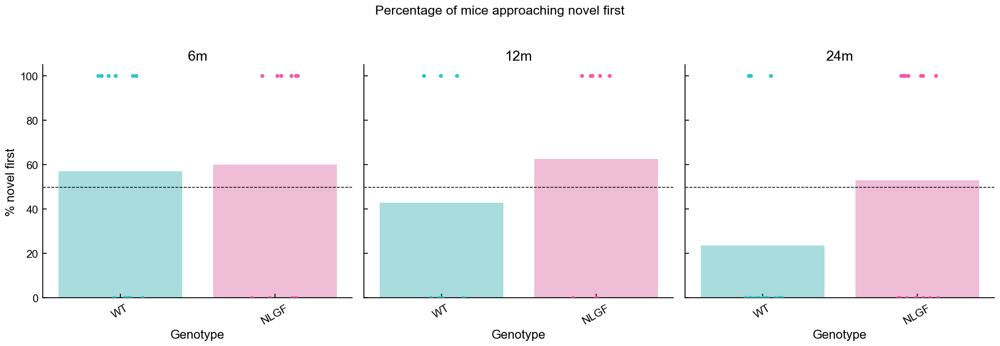

,Age,Genotype,percent_novel,n
0,12m,APP1-em1BDS,33.333333,9
1,12m,NLGF,62.500000,8
2,12m,WT,42.857143,7
3,24m,APP1-em1BDS,50.000000,4
4,24m,NLF,83.333333,6


In [38]:
if first_approach_df is not None:
    first_binary = first_approach_df.copy()
    first_binary["novel_first"] = (first_binary["FirstApproach"] == "novel").astype(int)

    first_percent = (
        first_binary
        .groupby(["Age", "Genotype"], as_index=False)
        .agg(
            percent_novel=("novel_first", lambda x: x.mean() * 100),
            n=("novel_first", "count")
        )
    )

    fig, axes = plt.subplots(1, len(AGE_ORDER), figsize=(18, 6), sharey=True)

    for ax, age in zip(axes, AGE_ORDER):
        sub = first_percent[first_percent["Age"] == age].copy()

        sns.barplot(
            data=sub,
            x="Genotype",
            y="percent_novel",
            order=GENO_ORDER,
            hue="Genotype",
            hue_order=GENO_ORDER,
            palette=GENO_COLORS,
            legend=False,
            alpha=0.45,
            ax=ax
        )

        sns.stripplot(
            data=first_binary[first_binary["Age"] == age].assign(percent=lambda d: d["novel_first"] * 100),
            x="Genotype",
            y="percent",
            order=GENO_ORDER,
            hue="Genotype",
            hue_order=GENO_ORDER,
            palette=GENO_COLORS,
            dodge=False,
            legend=False,
            size=5,
            jitter=0.15,
            ax=ax
        )

        ax.axhline(50, color="black", linestyle="--", linewidth=1)
        format_axes(ax)
        ax.set_title(age)
        ax.set_ylabel("% novel first" if age == AGE_ORDER[0] else "")
        ax.set_xlabel("Genotype")
        ax.tick_params(axis="x", rotation=30)
        ax.set_ylim(0, 105)

    fig.suptitle("Percentage of mice approaching novel first", y=1.03)
    plt.tight_layout()
    plt.show()

    display(first_percent.head())


## Save processed analysis summaries

This saves useful analysis-level tables from the MASTER data.


In [39]:
ANALYSIS_OUTPUT = MASTER_OUTPUT / "analysis_summaries"
ANALYSIS_OUTPUT.mkdir(exist_ok=True)

phase_total.to_csv(ANALYSIS_OUTPUT / "phase_total_by_age_genotype.csv", index=False)
avg_4h_summary.to_csv(ANALYSIS_OUTPUT / "average_exploration_4h_summary.csv", index=False)
avg_24h_summary.to_csv(ANALYSIS_OUTPUT / "average_exploration_24h_summary.csv", index=False)
cum_2h_summary.to_csv(ANALYSIS_OUTPUT / "cumulative_exploration_2h_summary.csv", index=False)
cum_24h_summary.to_csv(ANALYSIS_OUTPUT / "cumulative_exploration_24h_summary.csv", index=False)
mouse_di_2h.to_csv(ANALYSIS_OUTPUT / "mouse_level_DI_2h.csv", index=False)
mouse_di_10h.to_csv(ANALYSIS_OUTPUT / "mouse_level_DI_10h.csv", index=False)
mouse_di_24h.to_csv(ANALYSIS_OUTPUT / "mouse_level_DI_24h.csv", index=False)

if first_approach_df is not None:
    first_approach_df.to_csv(ANALYSIS_OUTPUT / "first_approach_cleaned.csv", index=False)

print("Saved summaries to:", ANALYSIS_OUTPUT)


Saved summaries to: /Volumes/Aimi_SmrtKg/NOR_MASTER/analysis_summaries


In [50]:
df.head()

,MouseSessionID,KageID,Cohort,Age,Genotype,Phase,total_sec
0,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,ITI_baseline,803.0
1,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,sample,1452.0
2,2024-05-may-jul_NLGF6m_Kage10,Kage10,2024-05-may-jul_NLGF6m,6m,WT,test,774.5
3,2024-05-may-jul_NLGF6m_Kage11,Kage11,2024-05-may-jul_NLGF6m,6m,WT,ITI_baseline,1077.5
4,2024-05-may-jul_NLGF6m_Kage11,Kage11,2024-05-may-jul_NLGF6m,6m,WT,sample,1828.0


In [51]:
df.columns

Index(['MouseSessionID', 'KageID', 'Cohort', 'Age', 'Genotype', 'Phase',
       'total_sec'],
      dtype='object')

In [ ]:
from scipy.stats import shapiro, ttest_ind, mannwhitneyu, f_oneway, kruskal
from statsmodels.stats.multitest import multipletests

In [ ]:
stats_df = binned_df.copy()

AGE_COL = "Age"
GENO_COL = "Genotype"

AGE_ORDER_STATS = ["6m", "12m", "24m"]
GENO_ORDER_STATS = ["WT", "NLGF"]

# Add/edit metrics here.
# Key = dataframe column name.
METRICS = {
    "total_sec": "Total exploration",
}

STATS_OUTPUT = Path("statistics_example")
STATS_OUTPUT.mkdir(exist_ok=True)

# Keep only WT and NLGF, and only the selected ages.
stats_df = stats_df.copy()
stats_df[AGE_COL] = stats_df[AGE_COL].astype(str).str.strip()
stats_df[GENO_COL] = stats_df[GENO_COL].astype(str).str.strip()
stats_df = stats_df[stats_df[AGE_COL].isin(AGE_ORDER_STATS)].copy()
stats_df = stats_df[stats_df[GENO_COL].isin(GENO_ORDER_STATS)].copy()

for metric in METRICS:
    if metric in stats_df.columns:
        stats_df[metric] = pd.to_numeric(stats_df[metric], errors="coerce")
    else:
        print(f"Warning: metric column not found and will be skipped: {metric}")

print("Data included in statistics:")
display(stats_df.groupby([AGE_COL, GENO_COL]).size().reset_index(name="n"))

stats_df.head()

Data included in statistics:


,Age,Genotype,n
0,12m,NLGF,2525
1,12m,WT,3004
2,24m,NLGF,6335
3,24m,WT,4789
4,6m,NLGF,3097
5,6m,WT,5860


,bin,left,right,left_sec,right_sec,total_sec,KageID,Genotype,Phase,rotation,window_end,NOR_side,cumulative_left_sec,cumulative_right_sec,cumulative_total_sec,Cohort,Age,MouseSessionID,time_min,time_hr
0,1,26,0,13.0,0.0,13.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,13.0,0.0,13.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,1,0.016667
1,2,52,0,26.0,0.0,26.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,39.0,0.0,39.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,2,0.033333
2,3,0,64,0.0,32.0,32.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,39.0,32.0,71.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,3,0.050000
3,4,2,0,1.0,0.0,1.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,40.0,32.0,72.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,4,0.066667
4,12,0,16,0.0,8.0,8.0,Kage10,WT,ITI_baseline,2024-06-08 12:04:23,2024-06-09 11:04:16,L,40.0,40.0,80.0,2024-05-may-jul_NLGF6m,6m,2024-05-may-jul_NLGF6m_Kage10,12,0.200000


In [56]:
normality_results = []

for metric, metric_label in METRICS.items():
    if metric not in stats_df.columns:
        continue

    for age in AGE_ORDER_STATS:
        for genotype in GENO_ORDER_STATS:
            sub = stats_df[
                (stats_df[AGE_COL] == age) &
                (stats_df[GENO_COL] == genotype)
            ]
            x = clean_values(sub, metric)
            W, p, result = shapiro_safe(x)

            normality_results.append({
                "metric": metric,
                "metric_label": metric_label,
                "age": age,
                "genotype": genotype,
                "n": len(x),
                "shapiro_W": W,
                "shapiro_p": p,
                "normality": result,
            })

normality_df = pd.DataFrame(normality_results)
normality_df.to_csv(STATS_OUTPUT / "normality_results.csv", index=False)

display(normality_df)


,metric,metric_label,age,genotype,n,shapiro_W,shapiro_p,normality
0,total_sec,Total exploration,6m,WT,5860,0.599048,1.896824e-75,not normal
1,total_sec,Total exploration,6m,NLGF,3097,0.597453,8.246084e-65,not normal
2,total_sec,Total exploration,12m,WT,3004,0.631824,1.785588e-62,not normal
3,total_sec,Total exploration,12m,NLGF,2525,0.612273,8.110954e-60,not normal
4,total_sec,Total exploration,24m,WT,4789,0.608660,6.021838e-74,not normal
5,total_sec,Total exploration,24m,NLGF,6335,0.485859,9.400752e-81,not normal


In [58]:
def p_to_stars(p):
    """Convert a p-value into significance stars."""
    if pd.isna(p):
        return "NA"
    if p < 0.0001:
        return "****"
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return "ns"


def clean_values(data, metric):
    """Return one clean numeric vector for a metric."""
    return pd.to_numeric(data[metric], errors="coerce").dropna()


def sem_numeric(x):
    """Standard error of the mean."""
    x = pd.to_numeric(pd.Series(x), errors="coerce").dropna()
    if len(x) <= 1:
        return np.nan
    return x.std(ddof=1) / np.sqrt(len(x))


def shapiro_safe(x):
    """Run Shapiro-Wilk safely. Needs at least 3 values."""
    x = pd.to_numeric(pd.Series(x), errors="coerce").dropna()
    if len(x) < 3:
        return np.nan, np.nan, "too few values"
    if len(x) > 5000:
        x = x.sample(5000, random_state=1)
    W, p = shapiro(x)
    return W, p, "normal" if p > 0.05 else "not normal"

In [59]:
wt_vs_nlgf_results = []

for metric, metric_label in METRICS.items():
    if metric not in stats_df.columns:
        continue

    for age in AGE_ORDER_STATS:
        wt = clean_values(
            stats_df[(stats_df[AGE_COL] == age) & (stats_df[GENO_COL] == "WT")],
            metric
        )
        nlgf = clean_values(
            stats_df[(stats_df[AGE_COL] == age) & (stats_df[GENO_COL] == "NLGF")],
            metric
        )

        row = {
            "metric": metric,
            "metric_label": metric_label,
            "age": age,
            "comparison": "WT vs NLGF",
            "WT_n": len(wt),
            "NLGF_n": len(nlgf),
            "WT_mean": wt.mean(),
            "NLGF_mean": nlgf.mean(),
            "WT_sem": sem_numeric(wt),
            "NLGF_sem": sem_numeric(nlgf),
        }

        if len(wt) < 2 or len(nlgf) < 2:
            row.update({
                "test": "not enough data",
                "statistic": np.nan,
                "p_value": np.nan,
                "stars": "NA",
            })
            wt_vs_nlgf_results.append(row)
            continue

        wt_norm_p = normality_df.query(
            "metric == @metric and age == @age and genotype == 'WT'"
        )["shapiro_p"].iloc[0]

        nlgf_norm_p = normality_df.query(
            "metric == @metric and age == @age and genotype == 'NLGF'"
        )["shapiro_p"].iloc[0]

        both_normal = (wt_norm_p > 0.05) and (nlgf_norm_p > 0.05)

        if both_normal:
            stat, p = ttest_ind(wt, nlgf, equal_var=False, nan_policy="omit")
            test_name = "Welch t-test"
        else:
            stat, p = mannwhitneyu(wt, nlgf, alternative="two-sided")
            test_name = "Mann-Whitney U"

        row.update({
            "test": test_name,
            "statistic": stat,
            "p_value": p,
            "stars": p_to_stars(p),
        })
        wt_vs_nlgf_results.append(row)

wt_vs_nlgf_df = pd.DataFrame(wt_vs_nlgf_results)
wt_vs_nlgf_df.to_csv(STATS_OUTPUT / "WT_vs_NLGF_by_age.csv", index=False)

display(wt_vs_nlgf_df)

,metric,metric_label,age,comparison,WT_n,NLGF_n,WT_mean,NLGF_mean,WT_sem,NLGF_sem,test,statistic,p_value,stars
0,total_sec,Total exploration,6m,WT vs NLGF,5860,3097,6.446758,5.799483,0.132318,0.158552,Mann-Whitney U,9049755.5,8.328964e-01,ns
1,total_sec,Total exploration,12m,WT vs NLGF,3004,2525,7.560253,7.606337,0.209101,0.242480,Mann-Whitney U,3965436.0,3.328816e-03,**
2,total_sec,Total exploration,24m,WT vs NLGF,4789,6335,6.937252,3.966535,0.155086,0.090452,Mann-Whitney U,18695901.5,1.844916e-99,****


In [ ]:
age_effect_results = []
pairwise_age_results = []

for metric, metric_label in METRICS.items():
    if metric not in stats_df.columns:
        continue

    for genotype in GENO_ORDER_STATS:
        groups = []
        group_names = []
        normal_flags = []

        for age in AGE_ORDER_STATS:
            x = clean_values(
                stats_df[(stats_df[AGE_COL] == age) & (stats_df[GENO_COL] == genotype)],
                metric
            )

            if len(x) >= 2:
                groups.append(x)
                group_names.append(age)

                norm_row = normality_df.query(
                    "metric == @metric and age == @age and genotype == @genotype"
                )
                p_norm = norm_row["shapiro_p"].iloc[0] if len(norm_row) else np.nan
                normal_flags.append(p_norm > 0.05)

        if len(groups) < 2:
            age_effect_results.append({
                "metric": metric,
                "metric_label": metric_label,
                "genotype": genotype,
                "comparison": "6m vs 12m vs 24m",
                "test": "not enough data",
                "statistic": np.nan,
                "p_value": np.nan,
                "stars": "NA",
            })
            continue

        all_normal = all(normal_flags)

        if len(groups) >= 3:
            if all_normal:
                stat, p = f_oneway(*groups)
                test_name = "One-way ANOVA"
            else:
                stat, p = kruskal(*groups)
                test_name = "Kruskal-Wallis"
        else:
            if all_normal:
                stat, p = ttest_ind(groups[0], groups[1], equal_var=False, nan_policy="omit")
                test_name = "Welch t-test, two ages only"
            else:
                stat, p = mannwhitneyu(groups[0], groups[1], alternative="two-sided")
                test_name = "Mann-Whitney U, two ages only"

        age_effect_results.append({
            "metric": metric,
            "metric_label": metric_label,
            "genotype": genotype,
            "comparison": " vs ".join(group_names),
            "test": test_name,
            "statistic": stat,
            "p_value": p,
            "stars": p_to_stars(p),
        })

        # Pairwise age comparisons, regardless of whether the overall test is significant.
        # This is useful for checking patterns, but only interpret them carefully.
        raw_pairwise = []
        for i in range(len(group_names)):
            for j in range(i + 1, len(group_names)):
                age1, age2 = group_names[i], group_names[j]
                x1, x2 = groups[i], groups[j]

                if all_normal:
                    pair_stat, pair_p = ttest_ind(x1, x2, equal_var=False, nan_policy="omit")
                    pair_test = "Welch t-test"
                else:
                    pair_stat, pair_p = mannwhitneyu(x1, x2, alternative="two-sided")
                    pair_test = "Mann-Whitney U"

                raw_pairwise.append({
                    "metric": metric,
                    "metric_label": metric_label,
                    "genotype": genotype,
                    "comparison": f"{age1} vs {age2}",
                    "test": pair_test,
                    "statistic": pair_stat,
                    "raw_p": pair_p,
                })

        if raw_pairwise:
            raw_p = [r["raw_p"] for r in raw_pairwise]
            _, corrected_p, _, _ = multipletests(raw_p, method="holm")
            for r, p_corr in zip(raw_pairwise, corrected_p):
                r["p_value_holm"] = p_corr
                r["stars"] = p_to_stars(p_corr)
                pairwise_age_results.append(r)

age_effect_df = pd.DataFrame(age_effect_results)
pairwise_age_df = pd.DataFrame(pairwise_age_results)

age_effect_df.to_csv(STATS_OUTPUT / "age_effect_within_genotype.csv", index=False)
pairwise_age_df.to_csv(STATS_OUTPUT / "pairwise_age_comparisons_holm.csv", index=False)

display(age_effect_df)
display(pairwise_age_df)

,metric,metric_label,genotype,comparison,test,statistic,p_value,stars
0,total_sec,Total exploration,WT,6m vs 12m vs 24m,Kruskal-Wallis,22.533230,1.279296e-05,****
1,total_sec,Total exploration,NLGF,6m vs 12m vs 24m,Kruskal-Wallis,342.048907,5.309132e-75,****


,metric,metric_label,genotype,comparison,test,statistic,raw_p,p_value_holm,stars
0,total_sec,Total exploration,WT,6m vs 12m,Mann-Whitney U,8320289.5,2.244917e-05,6.734750e-05,****
1,total_sec,Total exploration,WT,6m vs 24m,Mann-Whitney U,13466980.5,3.274049e-04,6.548098e-04,***
2,total_sec,Total exploration,WT,12m vs 24m,Mann-Whitney U,7307997.5,2.329519e-01,2.329519e-01,ns
3,total_sec,Total exploration,NLGF,6m vs 12m,Mann-Whitney U,3897449.0,8.355644e-01,8.355644e-01,ns
4,total_sec,Total exploration,NLGF,6m vs 24m,Mann-Whitney U,11762466.5,1.449436e-56,4.348308e-56,****
5,total_sec,Total exploration,NLGF,12m vs 24m,Mann-Whitney U,9504511.0,1.993214e-44,3.986427e-44,****
